Calculate the Bayes Factor for $M_r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
rabsmag_NSA = np.array(catalog_main['ELPETRO_ABSMAG'][:,4])

# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [6]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [7]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [9]:
del catalog_main, catalog_north, data

# Fit the $M_r$ distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [10]:
rabsmag_bins = np.arange(-24, -15, 0.1)

In [11]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

In [12]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-noRmin.pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

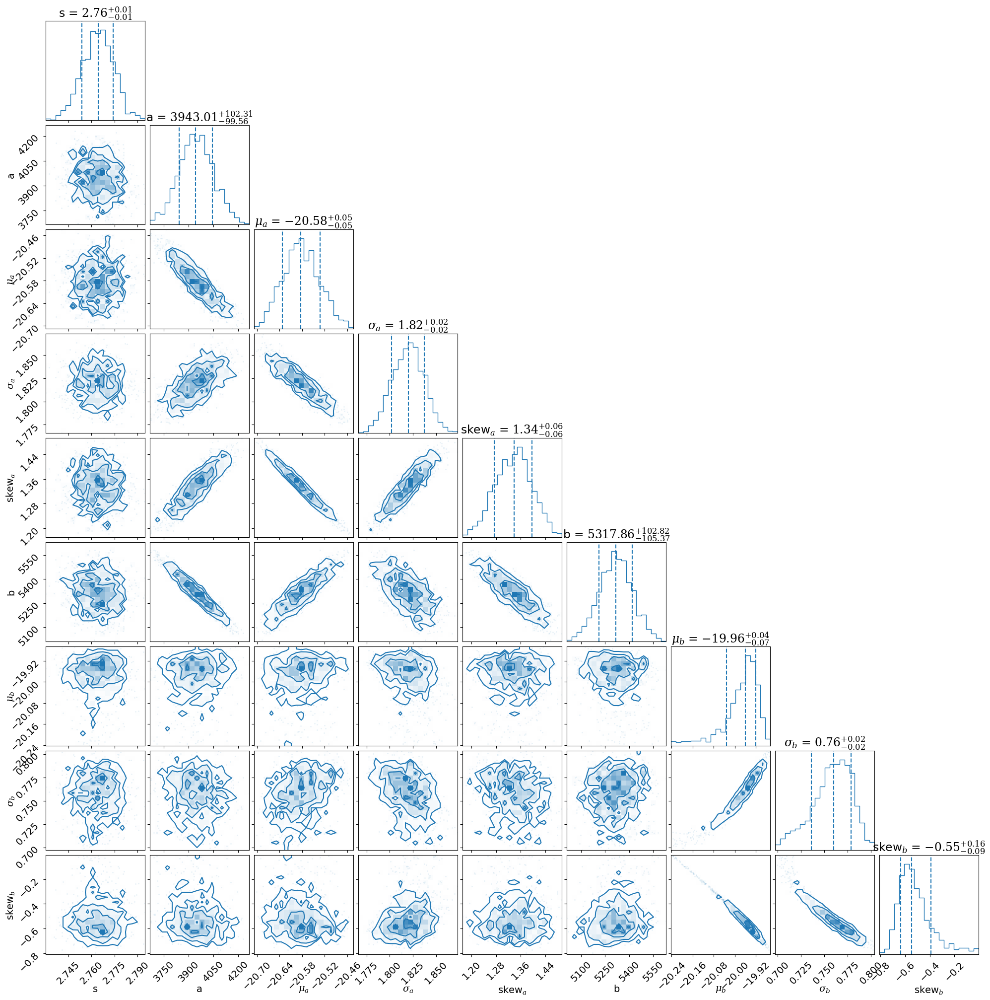

In [13]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [14]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1902.278095426298

In [15]:
V2noRmin_bestfit1 = np.mean(V2noRmin_results1['samples'], axis=0)

V2noRmin_bestfit1

array([ 2.7640090e+00,  3.9462593e+03, -2.0582193e+01,  1.8197628e+00,
        1.3358269e+00,  5.3159561e+03, -1.9976864e+01,  7.5754750e-01,
       -5.1400954e-01], dtype=float32)

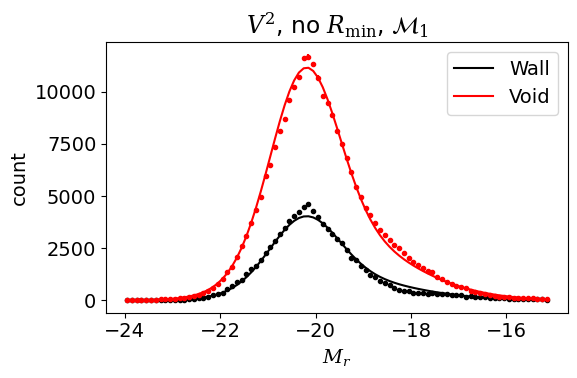

In [16]:
Model_1_plot(V2noRmin_bestfit1, 
             rabsmag_NSA[wall_noRmin], 
             rabsmag_NSA[void_noRmin], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$')

### 2-parent model

In [23]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-noRmin.pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

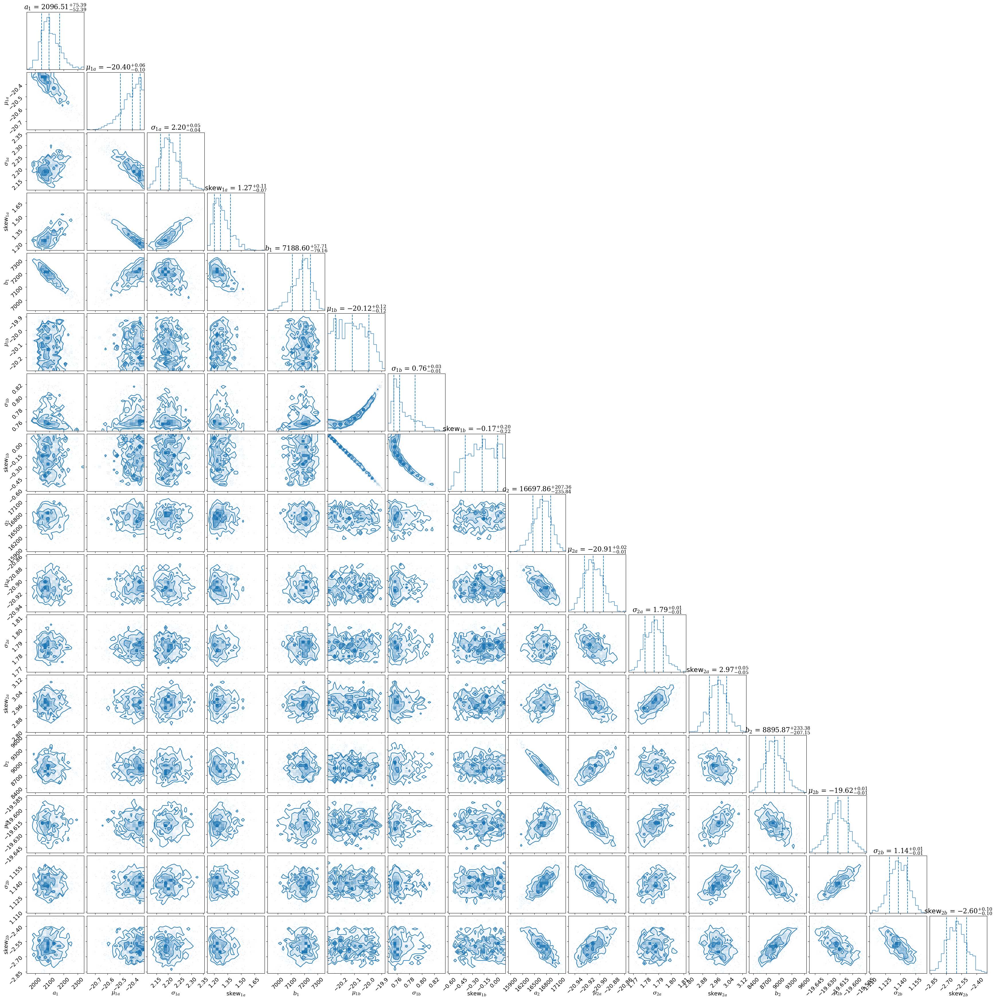

In [24]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [25]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM1_V2noRmin

-1902.278095426298

In [26]:
V2noRmin_bestfit2 = np.mean(V2noRmin_results2['samples'], axis=0)

V2noRmin_bestfit2

array([ 2.1066777e+03, -2.0413260e+01,  2.2085042e+00,  1.2906642e+00,
        7.1807798e+03, -2.0114424e+01,  7.7006483e-01, -1.8417045e-01,
        1.6686369e+04, -2.0909616e+01,  1.7867817e+00,  2.9740093e+00,
        8.9080137e+03, -1.9617432e+01,  1.1380090e+00, -2.5982749e+00],
      dtype=float32)

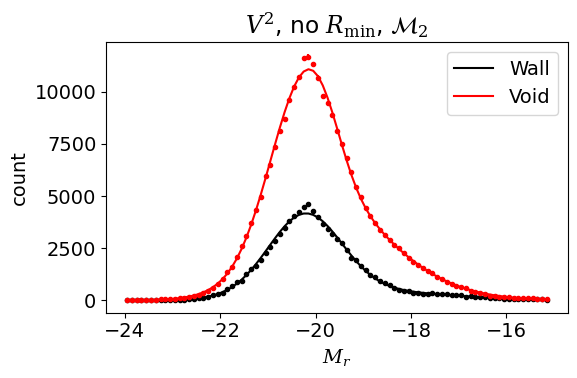

In [27]:
Model_2_plot(V2noRmin_bestfit2, 
             rabsmag_NSA[wall_noRmin], 
             rabsmag_NSA[void_noRmin], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [28]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 Mr: B12 = 0; log(B12) = -351.255


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [29]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-0p1.pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

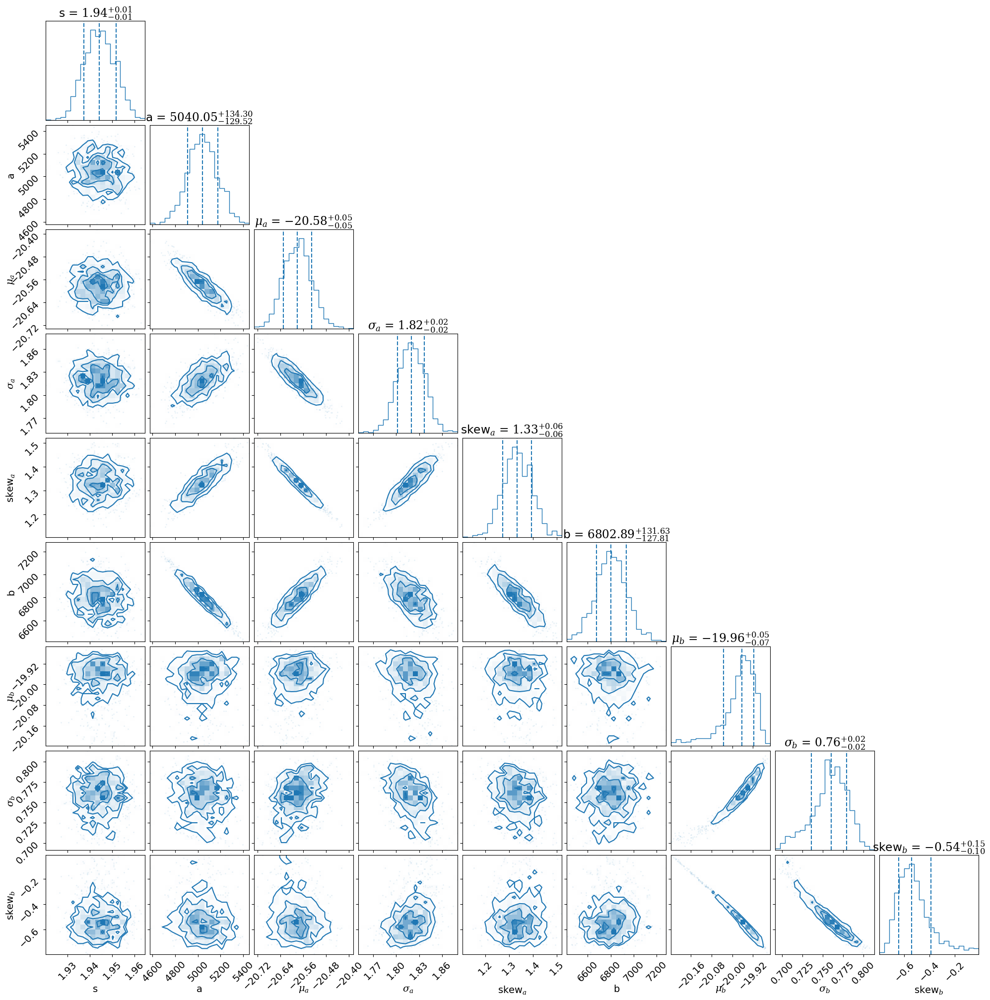

In [30]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [31]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-1272.7603757827192

In [32]:
V2_0p1_bestfit1 = np.mean(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.9443822e+00,  5.0397939e+03, -2.0580153e+01,  1.8193518e+00,
        1.3340362e+00,  6.8028667e+03, -1.9976070e+01,  7.5813031e-01,
       -5.1560396e-01], dtype=float32)

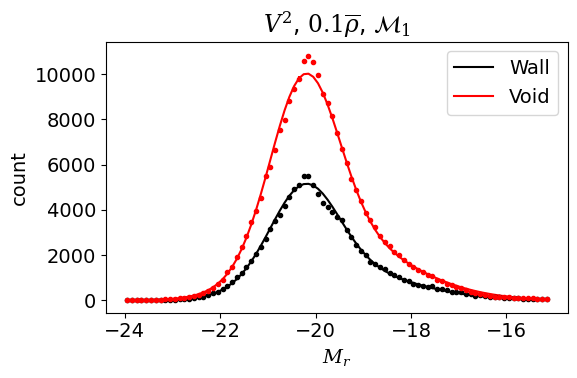

In [34]:
Model_1_plot(V2_0p1_bestfit1, 
             rabsmag_NSA[wall_0p1], 
             rabsmag_NSA[void_0p1], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [37]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-0p1.pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

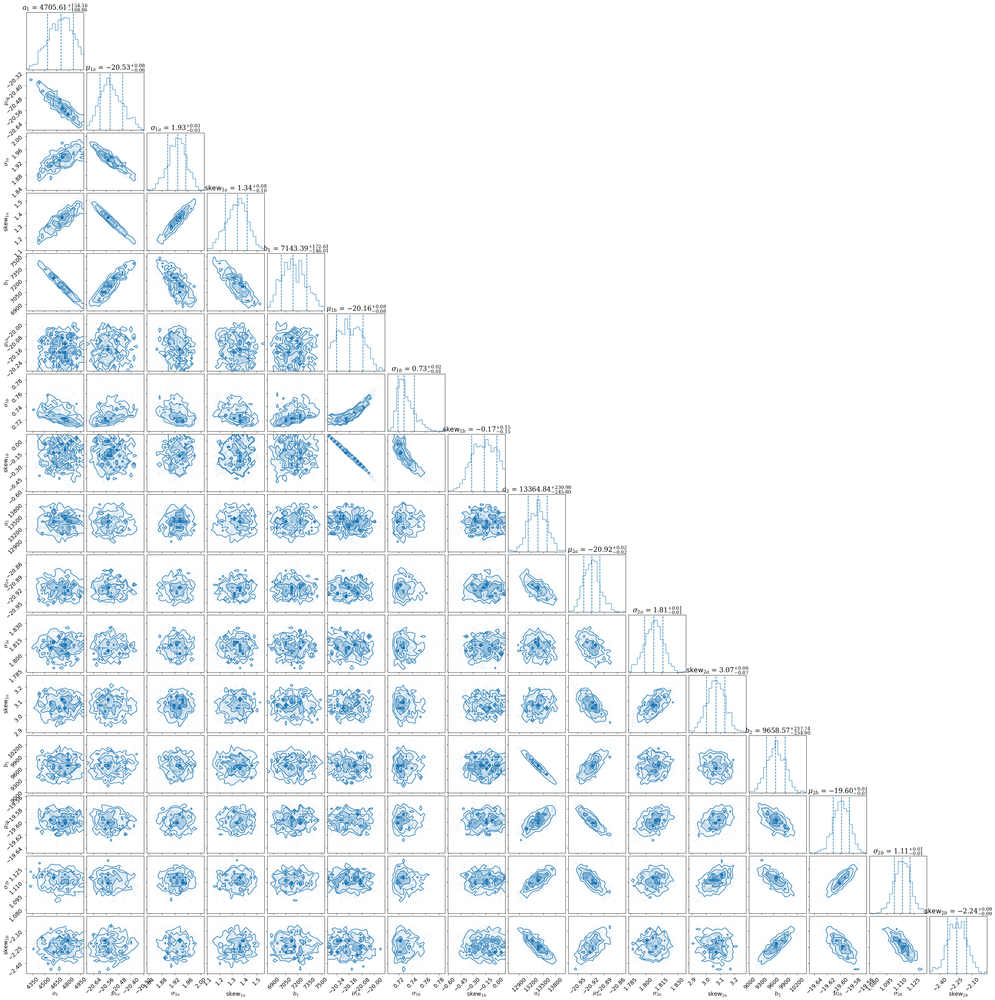

In [38]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [39]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM1_V2_0p1

-1272.7603757827192

In [40]:
V2_0p1_bestfit2 = np.mean(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 4.6975269e+03, -2.0525932e+01,  1.9269679e+00,  1.3370415e+00,
        7.1531704e+03, -2.0154104e+01,  7.3048127e-01, -1.7176679e-01,
        1.3357136e+04, -2.0917589e+01,  1.8073260e+00,  3.0698791e+00,
        9.6604619e+03, -1.9598059e+01,  1.1121963e+00, -2.2413583e+00],
      dtype=float32)

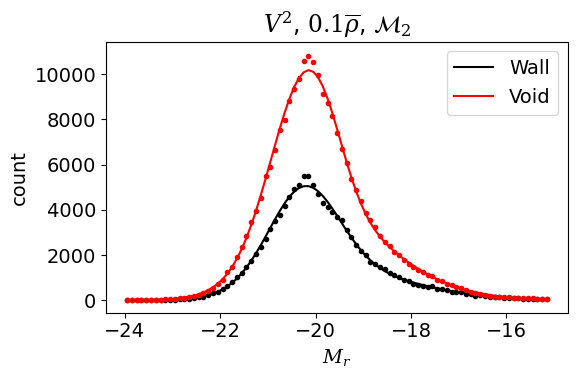

In [41]:
Model_2_plot(V2_0p1_bestfit2, 
             rabsmag_NSA[wall_0p1], 
             rabsmag_NSA[void_0p1], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [42]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 Mr: B12 = 1.3e-61; log(B12) = -60.887


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [43]:
temp_infile = open('pocoMC_results/sampler_results_M1_rabsmag_V2-0p3.pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

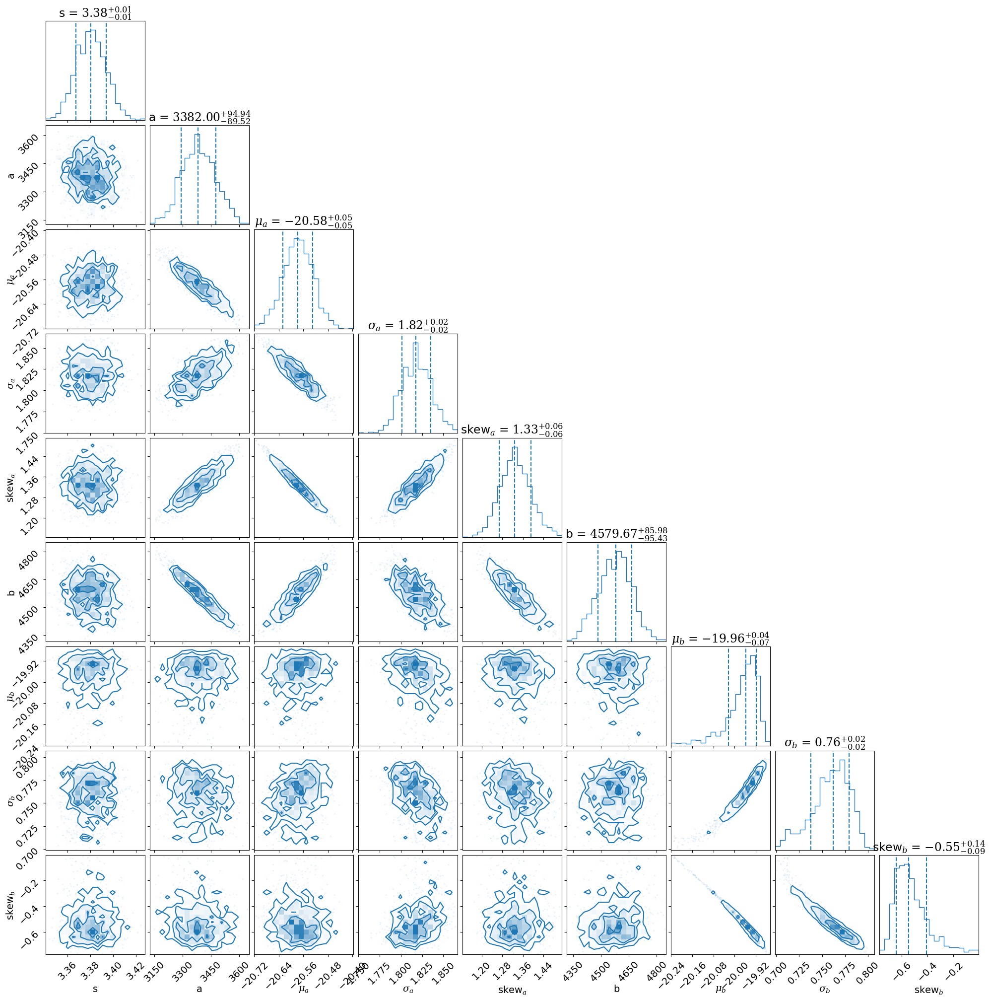

In [44]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [45]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-2722.0290509122815

In [46]:
V2_0p3_bestfit1 = np.mean(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.3805733e+00,  3.3854856e+03, -2.0578077e+01,  1.8183039e+00,
        1.3308173e+00,  4.5750586e+03, -1.9973408e+01,  7.5892341e-01,
       -5.2040768e-01], dtype=float32)

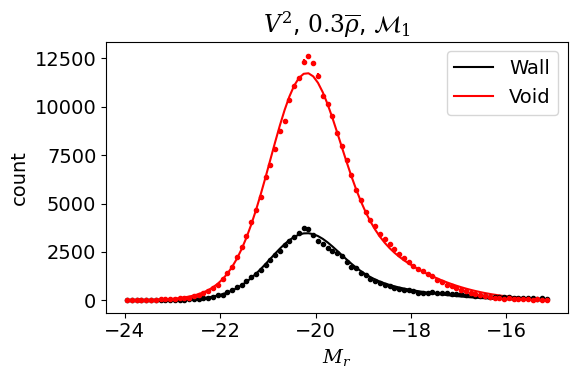

In [47]:
Model_1_plot(V2_0p3_bestfit1, 
             rabsmag_NSA[wall_0p3], 
             rabsmag_NSA[void_0p3], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [48]:
temp_infile = open('pocoMC_results/sampler_results_M2_rabsmag_V2-0p3.pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

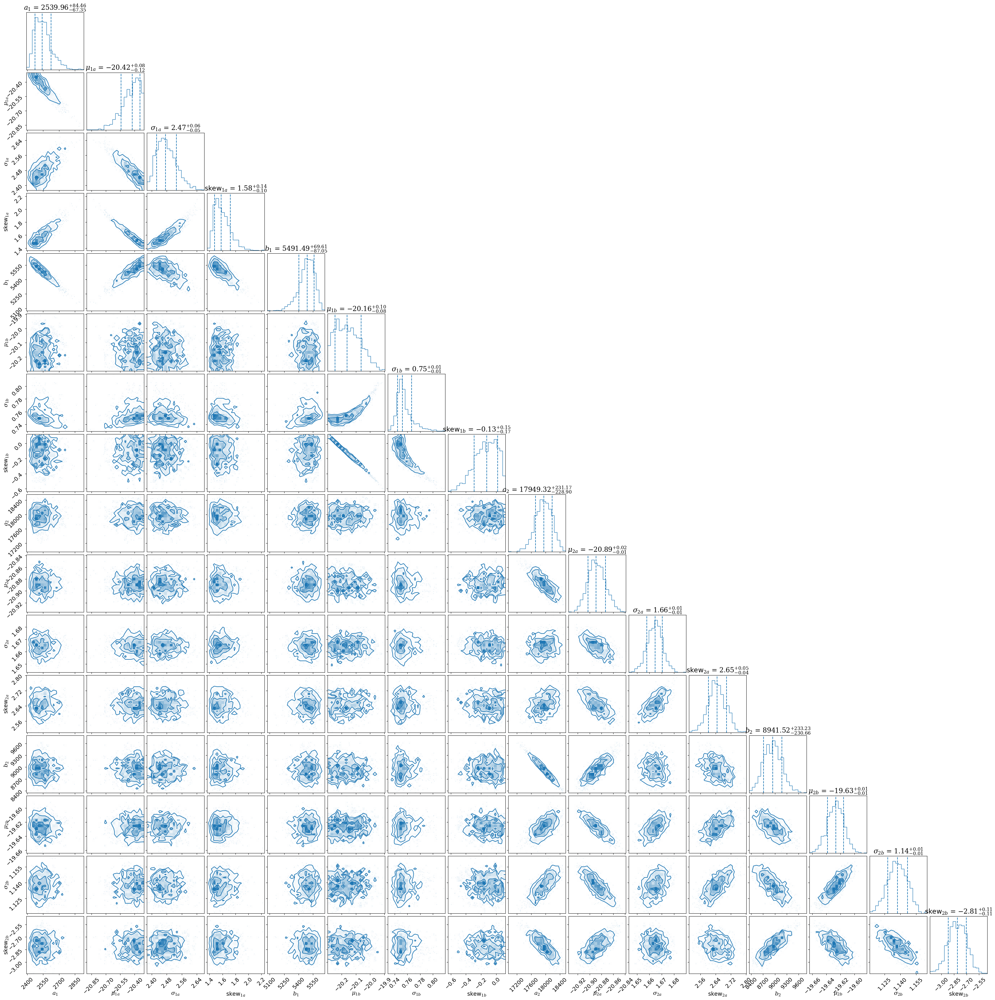

In [49]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [50]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM1_V2_0p3

-2722.0290509122815

In [51]:
V2_0p3_bestfit2 = np.mean(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 2.5509187e+03, -2.0442602e+01,  2.4790604e+00,  1.5995717e+00,
        5.4820000e+03, -2.0154306e+01,  7.5549579e-01, -1.4041056e-01,
        1.7944660e+04, -2.0887880e+01,  1.6644025e+00,  2.6468463e+00,
        8.9434209e+03, -1.9626928e+01,  1.1371744e+00, -2.8098159e+00],
      dtype=float32)

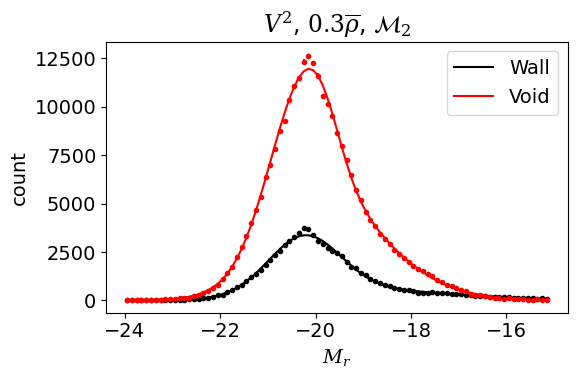

In [52]:
Model_2_plot(V2_0p3_bestfit2, 
             rabsmag_NSA[wall_0p3], 
             rabsmag_NSA[void_0p3], 
             rabsmag_bins, 
             2, 
             xlabel_text='$M_r$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [53]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 Mr: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 Mr: B12 = 0; log(B12) = -711.746
